### Library Imports

In [87]:
import pandas as pd
import re
import nltk
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from sklearn.feature_extraction.text import CountVectorizer, TfidfTransformer
from wordcloud import WordCloud
import matplotlib.pyplot as plt

In [88]:
nltk.download('stopwords')
nltk.download('wordnet')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\seren\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\seren\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [89]:
lemmatizer = WordNetLemmatizer()
vectorizer = CountVectorizer()
tfidf_izer = TfidfTransformer()

In [90]:
mbti_types = ["istj", "isfj", "infj", "intj", "istp", "isfp", "infp", "intp",
             "estj", "esfj", "enfj", "entj", "estp", "esfp", "enfp", "entp"]

### Reading Target Data File

In [91]:
mbti_df = pd.read_csv(r"C:\Users\seren\OneDrive\Documents\datasets_3730\mbti_cleaned.csv")

In [92]:
mbti_df.head()

,type,post1,post2,post3,post4,post5,post6,post7,post8,post9,...,post41,post42,post43,post44,post45,post46,post47,post48,post49,post50
0,INFP,'I used to play a bit of Skyrim (i found it ap...,"Hello, I am a former member of PC. I decided ...",sincere sensations have left my body to aid ot...,i've been told i look like jackson rathbone (t...,this one is of me killing myself slowly with a...,the video is me and my band (i'm the singer cl...,sudden movement crackling noises camp fire jo...,trapped in his own skin he opened his eyes to ...,when your cigarette smoke is inspiration enoug...,...,children redirect your eyes examine your lives...,i see it this way everything tends towards cha...,"yes, i like going to social events to observe ...",lyrics that could be read off of paper like po...,ideal you,real you,Introversion,0.7,73% Extroversion,0.23
1,ENFP,"'Where would you live? Canada/US, somewhere wi...",I'm passively attracted to certain attributes ...,I can be both impatient and stubborn which are...,You're so cute Wait... you're not on drugs? Ca...,I want to console and always be there for a gu...,Never posted in the ENFP section before since ...,There must be something wrong with my personal...,Really got to start posting videos here!! ...,Jeff Buckley! He was such a beautiful human be...,...,Completely over-thinking life right now or am ...,NONE OF MY LISTS ARE IN ANY ORDER 25 Songs yo...,ideal you,real you,Introversion,0.43,73% Extroversion,0.7,40% Intuitive,0.73
2,INTP,'I'm an INTP who knows an ISFJ and an ESFJ. I ...,cheeky nandos,I love Paula Polestar,"I'm pretty thin, but not underweight. My weigh...",How much wood does a woodchuck chuck if a wood...,I'm never lonely.,VIDEO - Furry Class Presentation,The Cringe Channel Lord help us.,https://www.youtube.com/watch?v=rkZ9sSgGPrs,...,XD im rAdomer than u!!!lol....this is a good t...,"I came from a religious family too, like many ...","Why are you drunk, sir?",I'm so tired. Today during school I was buzzin...,Holy shit the number of pages,I don't know how I would handle that situation.,I don't know how I would handle that situation.,Hmm....maybe.,"Dogs are shit, cats are also shit, animals suck.",376570
3,INFJ,"'Some people need more, others need less. But ...",:sun-smiley:,"A lot of problems can be solved, if you proper...",:hugs:,Caffeinated and Optimistic. :smileys-sunbathin...,"473746 The process is very relaxing, and the ...",Sounds like my life growing up. Of course publ...,Everything is better if kept simple...,Fuck You. And fuck you. And fuck YOU. (Venting...,...,My answers are simple and to the point since I...,From brunette to blonde,"Today like everyday, I struggle to find a bala...",Any threads out there for INFJ parents to vent...,Deep down we're all just wild animals that soc...,I understand. As an INFJ you automatically con...,Same here. I don't talk to either my mom or da...,So a non believer trolling about. A true INFJ ...,I think the easiest way to recognize it is whe...,471162
4,INTP,"'It would be funny to Ask them,What is the dif...",I think the first one might have to do with ac...,Absolutely.I wish I could do maths and other s...,I agree with Chucky.I contact people if I have...,https://www.youtube.com/watch?v=e72tG80LmsU I ...,https://www.youtube.com/watch?v=myc7eHGg5y4&fe...,Ne. https://www.youtube.com/watch?annotation_...,Your avatar.It looks as though the thing looks...,Why would anyone want to fake their personalit...,...,686154,686098686106,It can be ASCII as well as Hexadecimal numbers...,Not yet decided on any of the existing theories.,https://www.youtube.com/watch?v=J5iJSXaVvao h...,I thought Artificial neural networks was the(...,I use Audacity.Which one(software) do you use ...,What software did you use for mixing?Btw You h...,683914,683906


### Data Pre-Processing

In [93]:
for column in mbti_df.columns[1:]:

    # to lower case
    mbti_df[column] = mbti_df[column].str.lower()

    # remove URLs
    mbti_df[column] = mbti_df[column].apply(lambda x: re.sub(r'http\S+', ' ', str(x), flags = re.MULTILINE))

    # remove special characters and numbers
    mbti_df[column] = mbti_df[column].apply(lambda x: re.sub(r'[^a-zA-Z\s]', ' ', str(x)))

    # remove extra spaces
    mbti_df[column] = mbti_df[column].str.replace(r'\s+', ' ', regex = True)

    # remove the stop words
    stopWords = set(stopwords.words('english'))
    mbti_df[column] = mbti_df[column].apply(lambda x: ' '.join([word for word in str(x).split() if word not in stopWords]))
    
    # remove the mbti types from the dataset
    for mbti in mbti_types:
        mbti_df[column] = mbti_df[column].str.replace(mbti.lower(), '')
    
    # lemmatize the words in the dataset
    mbti_df[column] = mbti_df[column].apply(lambda x: ' '.join([lemmatizer.lemmatize(word) for word in str(x).split()]))

In [94]:
mbti_df.head(3)

,type,post1,post2,post3,post4,post5,post6,post7,post8,post9,...,post41,post42,post43,post44,post45,post46,post47,post48,post49,post50
0,INFP,used play bit skyrim found appealing able evil...,hello former member pc decided create new user...,sincere sensation left body aid poet rhyming w...,told look like jackson rathbone guy play jaspe...,one killing slowly cigarette roll cause tax sh...,video band singer clinging mic wearing shirt w...,sudden movement crackling noise camp fire joy ...,trapped skin opened eye see figure paralyzed f...,cigarette smoke inspiration enough write poem ...,...,child redirect eye examine life keep mind mind...,see way everything tends towards chaos anyway ...,yes like going social event observe people usu...,lyric could read paper like poetry lyric provo...,ideal,real,introversion,,extroversion,
1,ENFP,would live canada u somewhere view stunning mo...,passively attracted certain attribute guy thin...,impatient stubborn great mix usually look ever...,cute wait drug whatever stop positive stop neg...,want console always guy know tough life time t...,never posted section since type seems changed ...,must something wrong personality always proble...,really got start posting video loving music re...,jeff buckley beautiful human every way also au...,...,completely thinking life right thinking idea h...,none list order song wish could listed thread ...,ideal,real,introversion,,extroversion,,intuitive,
2,INTP,know want friend trouble approaching without f...,cheeky nandos,love paula polestar,pretty thin underweight weight normal,much wood woodchuck chuck woodchuck could chuc...,never lonely,video furry class presentation,cringe channel lord help u,,...,xd im radomer u lol good threab becuz mean mee...,came religious family like many people thread ...,drunk sir,tired today school buzzing thought usual could...,holy shit number page,know would handle situation,know would handle situation,hmm maybe,dog shit cat also shit animal suck,


### Feature Extraction

In [95]:
posts_df = mbti_df.columns[1:]

In [102]:
importantScoreList = []

for mt in mbti_df['type'].unique():

    # seperate each MBTI types
    mbtiTypes_df = mbti_df[mbti_df['type'] == mt]

    mbtiTypes_df['combined_posts'] = mbtiTypes_df[posts_df].apply(lambda x: ' '.join(x.values.astype(str)), axis=1)

    # for Vectorizer training
    x_count_train = vectorizer.fit_transform(mbtiTypes_df['combined_posts'])
    x_tfidf_train = tfidf_izer.fit_transform(x_count_train)

    vectored_df = pd.DataFrame(x_tfidf_train.toarray(), columns= vectorizer.get_feature_names_out())

    importanceScores = vectored_df.mean()
    importanFeatures = dict(zip(vectored_df.columns, importanceScores))

    importantScoreList.append((mt, importanFeatures))

C:\Users\seren\AppData\Local\Temp\ipykernel_2784\1370067962.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  mbtiTypes_df['combined_posts'] = mbtiTypes_df[posts_df].apply(lambda x: ' '.join(x.values.astype(str)), axis=1)
C:\Users\seren\AppData\Local\Temp\ipykernel_2784\1370067962.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  mbtiTypes_df['combined_posts'] = mbtiTypes_df[posts_df].apply(lambda x: ' '.join(x.values.astype(str)), axis=1)
C:\Users\seren\AppData\Local\Temp\ipykernel_2784\1370067962.py:8

In [103]:
importantScoreList

[('INFP',
  {'aa': 0.0002244172886285624,
   'aaa': 4.6557627004618935e-05,
   'aaaa': 9.890058418024029e-05,
   'aaaaa': 4.941671619462851e-05,
   'aaaaaa': 5.025111963029785e-05,
   'aaaaaaaa': 5.025111963029785e-05,
   'aaaaaaaaa': 5.025111963029785e-05,
   'aaaaaaaaaaaaaaaaa': 4.545896796603272e-05,
   'aaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaa': 5.842874542332041e-05,
   'aaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaagggghhh': 4.4635821229518086e-05,
   'aaaaaaaaaaaaaaaarg': 4.6100903227241266e-05,
   'aaaaaaaaaarrgggh': 4.468998750871246e-05,
   'aaaaaaaahhhhhhhhhhhhhhhhhh': 4.191814269824662e-05,
   'aaaaaaaarrrrggggggghhhhhh': 4.4635821229518086e-05,
   'aaaaaaah': 4.558306678416265e-05,
   'aaaaaaall': 5.0485859902127025e-05,
   'aaaaaahhh': 5.676145635505601e-05,
   'aaaaaand': 9.104635090527616e-05,
   'aaaaah': 5.2055407381334737e-05,
   'aaaaall': 4.008484427366524e-05,
   'aaaaand': 0.00014289427406550336,
   'aaaaarggghh': 4.576046965474143e-05,
   'aaaah': 0.000118390574019

### Plotting Word Cloud and Importance for each MBTI Types

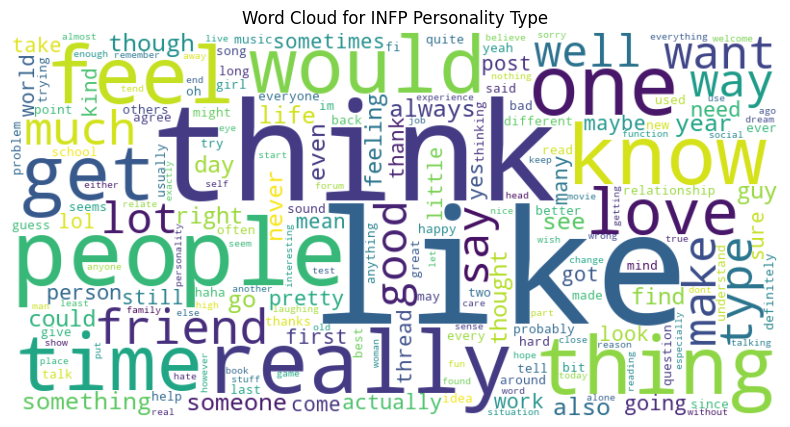

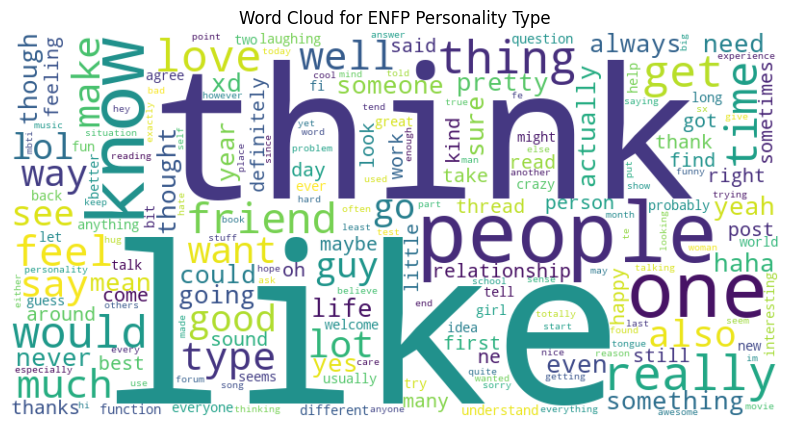

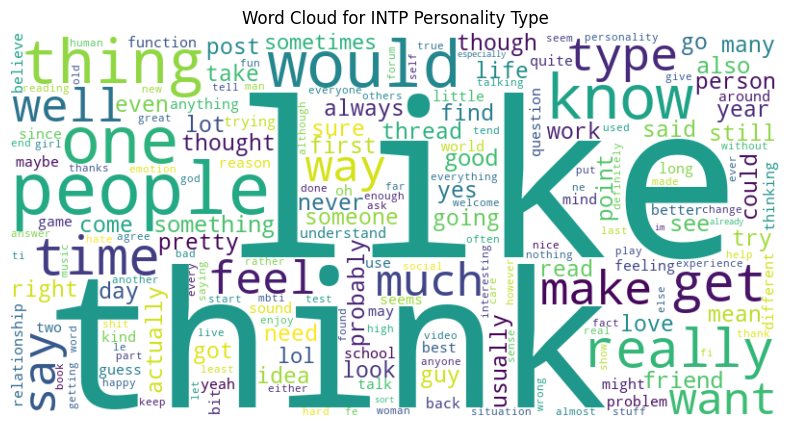

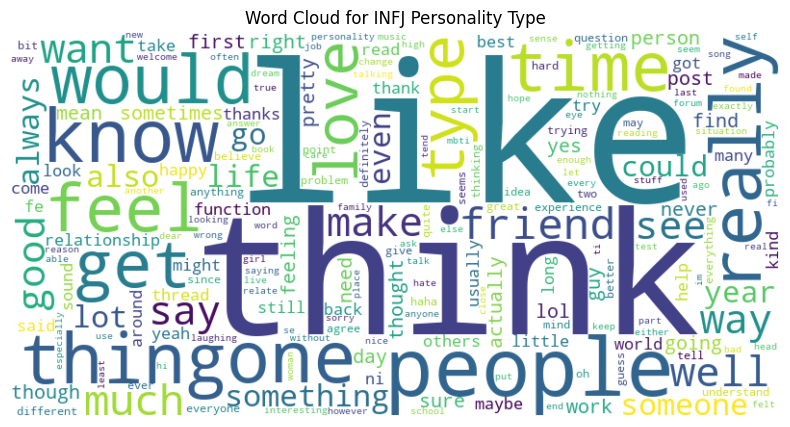

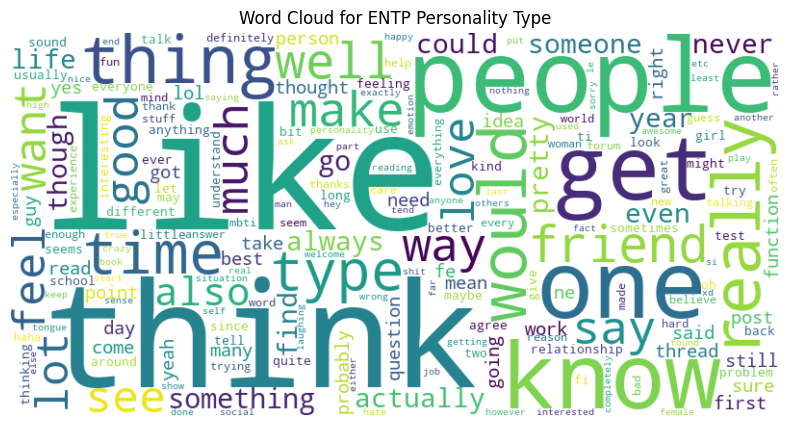

...

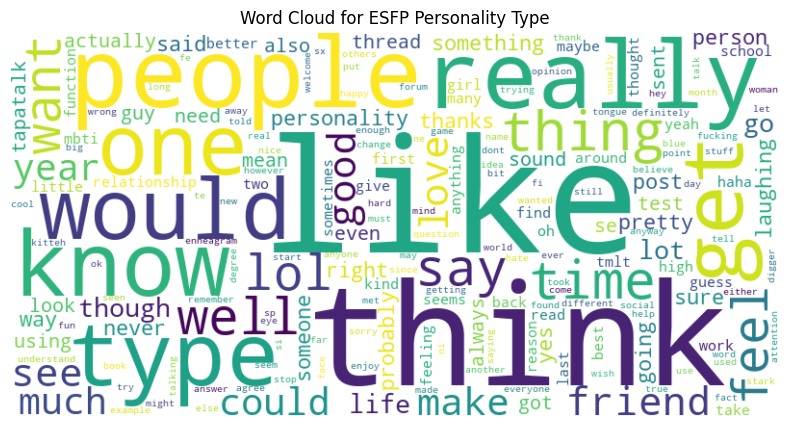

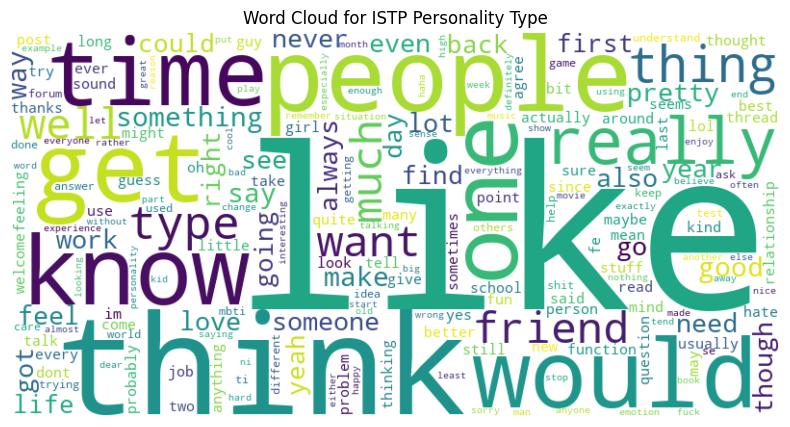

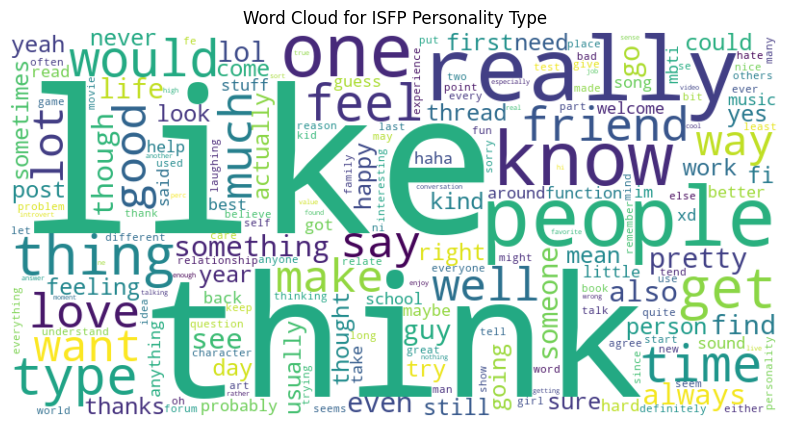

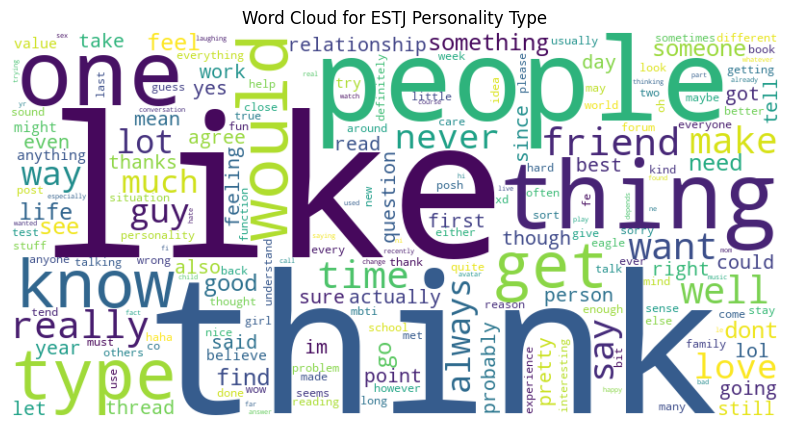

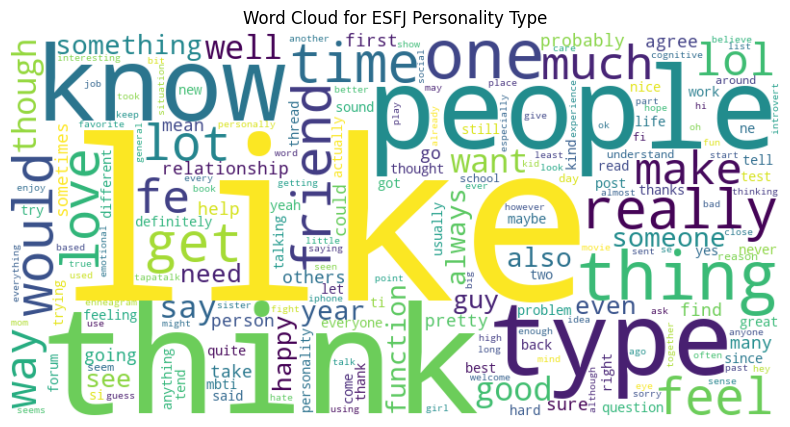

In [104]:
# for all the words
for mbti, scores in importantScoreList:
    mbti_str = str(mbti)
    wordCloud_plt = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(scores)
    
    plt.figure(figsize=(10,5))
    plt.imshow(wordCloud_plt, interpolation='bilinear')
    plt.axis('off')
    plt.title(f'Word Cloud for {mbti_str} Personality Type')
    plt.show()

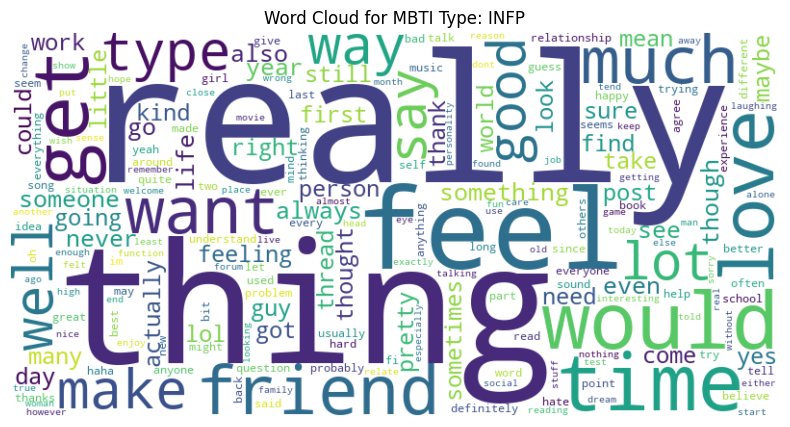

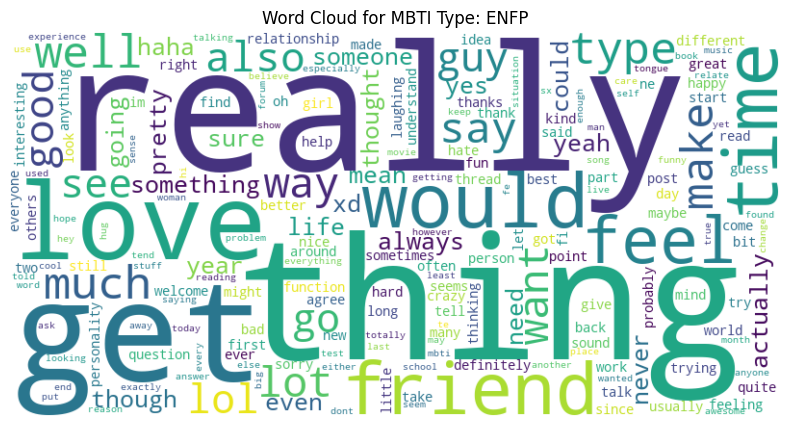

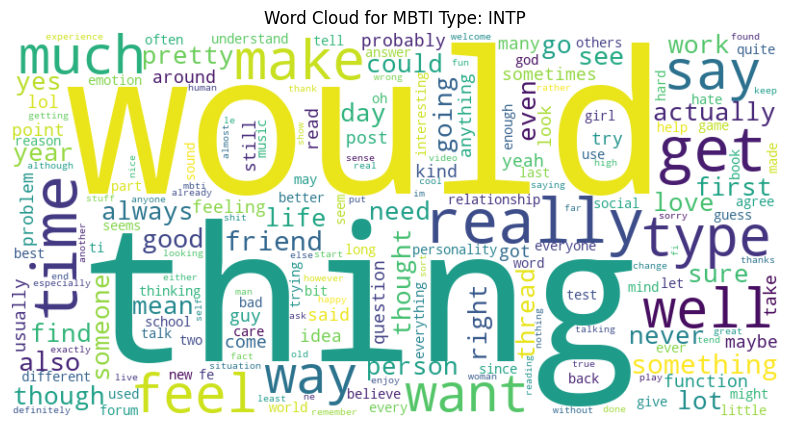

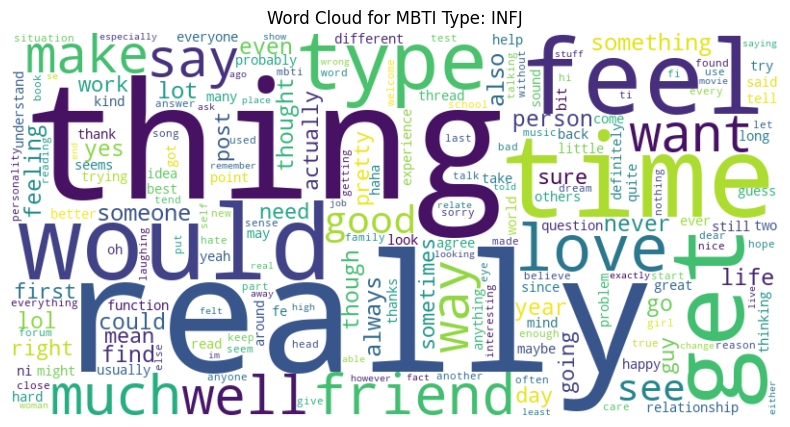

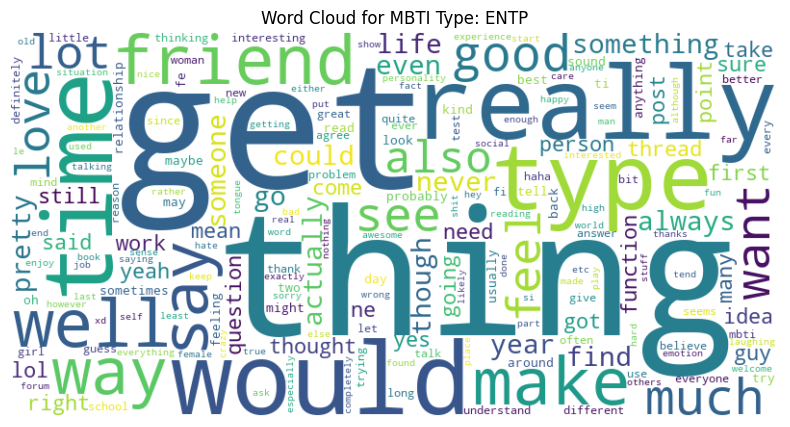

...

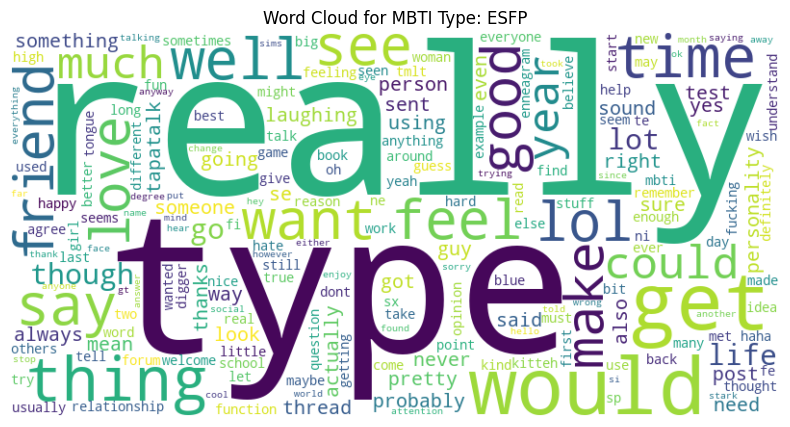

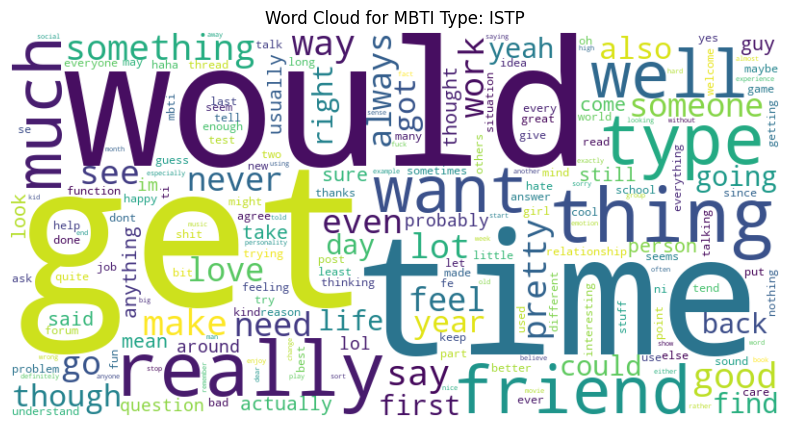

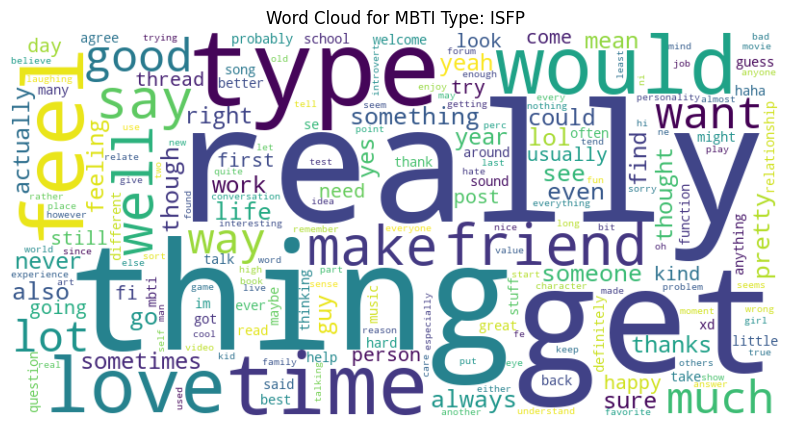

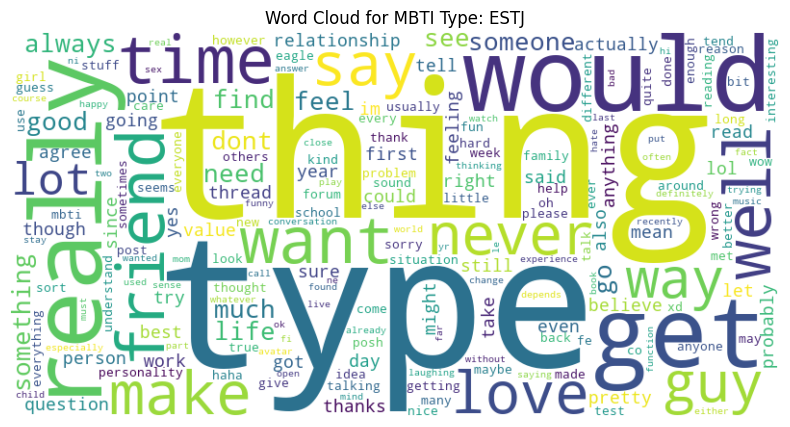

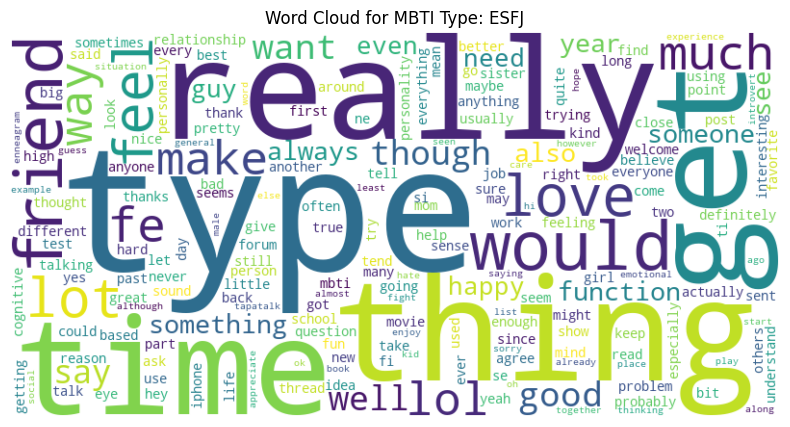

In [107]:
# List of words to remove
words_to_remove = ['think', 'like', 'one', 'people', 'know']

for mbti, importance_scores in importantScoreList:
    
    importance_scores_filtered = {word: importance for word, importance in importance_scores.items() if word.lower() not in words_to_remove}
    mbti_str = str(mbti)

    wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(importance_scores_filtered)

    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title('Word Cloud for MBTI Type: ' + mbti_str)  # Concatenate the string
    plt.axis('off')
    plt.show()
